# GUC NETW 1003 Kmeans Assginmnet 

Objective: exercise is to learn how to use build and use  kmeans clustering algortrithm    

At the end of this lab you will be able to
> 1. Build and run a K-means algorithm.
> 2. Know how to evalute K-means Algorithm 
> 2. Understand the effect of the parmeters ont he perfromance of the algorithm .
> 3. Understand the effect of distance.

## 1. Wirte K means function 

import required libraries 

In [101]:
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.datasets import make_moons

> ### 1.1. Code for the distance function 

write a function to calculate the distance between a set of cluster centroids and all the data points 

Cluster_Distances = GUC_Distance ( Cluster_Centroids, Data_points, Distance_Type) 
* The function shoud be able to handel data points with any number of features and any number of points 
* The function should be able to handle any K number of cluster centroids 
* To inrease speed do that in matrix format using numpy
* This should produce a matrix with rows equal to data points columns equal K 
* You should be able to calculate different types of Distance. In this assginmnet you are required to implement the following two 
    - Ecluidian distance
    - Pearson correlation distance
  

In [109]:
def GUC_Distance ( Cluster_Centroids, Data_points, Distance_Type ):
    Cluster_Centroids_np = Cluster_Centroids.to_numpy()
    Data_points_np = Data_points.to_numpy()
    Cluster_Distance = []
    for datapoint in Data_points_np:
        for centroid in Cluster_Centroids_np:
                if Distance_Type == "Euclidean":
                    Cluster_Distance.append(np.sqrt(np.sum((datapoint - centroid) ** 2)))
                elif Distance_Type == "Pearson":
                    data_mean = np.mean(datapoint)
                    centroid_mean = np.mean(centroid)
                    numerator = np.sum((datapoint - data_mean) * (centroid - centroid_mean))
                    denominator = np.sqrt(np.sum((datapoint - data_mean) ** 2) * np.sum((centroid - centroid_mean) ** 2))
                    distance = 1 - (numerator / denominator)
                    Cluster_Distance.append(distance)
                    
    return np.array(Cluster_Distance).reshape(len(Data_points_np), len(Cluster_Centroids_np))

In [110]:
####TEST
data_dir = "F:/semester 10/(NETW1013) Machine Learning/Assignment 1/"
customer_df = pd.read_csv(data_dir + "Customer data.csv")
customer_data_df=customer_df.set_index("ID")
customer_data_df

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
ID,,,,,,,
100000001,0,0,67,2,124670,1,2
100000002,1,1,22,1,150773,1,2
100000003,0,0,49,1,89210,0,0
100000004,0,0,45,1,171565,1,1
100000005,0,0,53,1,149031,1,1
...,...,...,...,...,...,...,...
100001996,1,0,47,1,123525,0,0
100001997,1,1,27,1,117744,1,0
100001998,0,0,31,0,86400,0,0


In [111]:
###creating random centroids
Cluster_Centroids= pd.DataFrame({'Sex':[0,1],'Marital status':[0,1], 'Age':[30,45], 'Education':[0,2], 'Income':[10500,25000],
                               'Occupation':[1,0], 'Settlement Size':[2,1]})
Cluster_Centroids

,Sex,Marital status,Age,Education,Income,Occupation,Settlement Size
0,0,0,30,0,10500,1,2
1,1,1,45,2,25000,0,1


In [112]:
###Testing euclidean distance 
Distance_Type="Euclidean"
Euclidean_Distance= GUC_Distance(Cluster_Centroids,customer_data_df,Distance_Type)
Euclidean_Distance

array([[114170.00601296,  99670.00244808],
       [140273.00023882, 125773.00211492],
       [ 78710.00233134,  64210.00015574],
       ...,
       [ 75900.00003953,  61400.00165309],
       [ 87468.00025152,  72968.00303558],
       [ 57916.000259  ,  43416.00468721]])

In [113]:
###Testing pearson distance 
Distance_Type="Pearson"
Pearson_Distance= GUC_Distance(Cluster_Centroids,customer_data_df,Distance_Type)
Pearson_Distance

array([[2.52463813e-06, 7.38440763e-07],
       [3.46452095e-06, 1.28177603e-06],
       [2.48829406e-06, 7.17253724e-07],
       ...,
       [2.91733066e-06, 9.57052615e-07],
       [3.21130447e-06, 1.12711936e-06],
       [2.90164009e-06, 9.48057280e-07]])

> ### 1.2. Code for K means function 

> Loop until a stopping condition 

> > in the loop do the following 
> > 1. Cluster Assginmnet 
> > > * Use the GUC_Distance to calculate between each cluster head and all the points 
> > > * Find the value and index of the minimum distance  for each row. 
> > > * for each point in the row use the index of the minmum distance to represent the cluster Centroid that this point will belong to.
> > > * Calculate and record the mean square distance for each cluster  
> > > * Use the mean square distances to calculate a stopping condition (e.g the sum of mean distances)
> > 2. Updtate Centroids  
> > > * Update the value for the cluster heads by calculating the mean value for the points in each cluster 
> > >  * Calculate the Cluster Metric (Distortion Function)
> > > > a number indicating the how good the clusters are . An example cluster metric is the  (sum of squared error between each point and its cluster center) 

In [114]:
def GUC_Kmean(Data_points, Number_of_Clusters,  Distance_Type ):
    min_distance=0.001
    previous_mean_square_distances=np.inf
    prev_thresh=np.inf
    
    # write code for intial cluster heads here
    Data_points_np=Data_points.to_numpy()
    data_ranges = np.ptp(Data_points_np, axis=0) #maximum-minimum
    cluster_heads = np.random.rand(Number_of_Clusters, Data_points_np.shape[1]) * data_ranges
    
    # write your your loop
    no_of_iterations=0
    while True:
    #Cluster Assignment: calculate el distance between each datapoint and each cluster head and assign cluster
        cluster_heads_df = pd.DataFrame(cluster_heads, columns=Data_points.columns)
        cluster_distances=GUC_Distance(cluster_heads_df,Data_points,Distance_Type) 
        assigned_cluster=np.argmin(cluster_distances,axis=1) 

    #Calculate mean square distance for each cluster:
        thresh=0
        mean_square_distances = np.zeros(Number_of_Clusters)
        for k in range (Number_of_Clusters):
            cluster_points = Data_points_np[assigned_cluster == k]
            if len(cluster_points) > 0:
                mean_square_distances[k]= (np.mean(np.sum((cluster_points - cluster_heads[k])**2, axis=1)))
            else:
                mean_square_distances[k]=0
            thresh+=np.sum((cluster_points - cluster_heads[k]) ** 2)
            
    #Check Stopping Condition:
        eps =0.0001
        if np.sum(mean_square_distances) < min_distance or np.allclose(mean_square_distances, previous_mean_square_distances, atol=eps):
            break
        if (abs(thresh - prev_thresh) < eps).any():
            break
            
        previous_mean_square_distances=mean_square_distances
        prev_thresh=thresh
            
    #Update Centroids:
        cluster_heads_new=np.zeros((Number_of_Clusters,Data_points_np.shape[1]))
        for k in range(Number_of_Clusters):
            cluster_points = Data_points_np[assigned_cluster == k]
            if len(cluster_points) > 0:
                cluster_heads_new[k] = np.mean(cluster_points,axis=0)
            else:
                cluster_heads_new[k] = cluster_heads[k] 
        
        if np.allclose(cluster_heads, cluster_heads_new, atol=1e-5):  # Convergence check
            break
        else:
            cluster_heads = cluster_heads_new
            
        no_of_iterations+=1
        
    #Calculate Cluster Metric:
    squared_errors = np.zeros(Number_of_Clusters)
    for k in range(Number_of_Clusters):
        cluster_points = Data_points_np[assigned_cluster == k]
        squared_errors[k]=np.sum((cluster_points - cluster_heads[k])**2)
    Cluster_Metric=np.sum(squared_errors)
    Final_Cluster_Distance=cluster_distances
    
    # Create km object
    from sklearn.cluster import KMeans
    
    km = KMeans(n_clusters=len(cluster_heads), init=cluster_heads, n_init=1)
    km.labels_ = assigned_cluster
    km.cluster_centers_ = cluster_heads
    
    # Display clusters
    display_cluster(Data_points, km, Number_of_Clusters)

    return [Final_Cluster_Distance,Cluster_Metric] 

## 2. Display Results 

* below is a an example fuction that displayes Clusters in 2D 

* You need to change the function so that is can display an n dimension data in the form of pairs of subplot 2D figures 

* The function is a helper function that is originaly be found in 
https://www.coursera.org/learn/ibm-unsupervised-learning/


In [115]:
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt

> #### 2.1. helper Display function 

In [129]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km,num_clusters):
    #create 20 different colors to highlight each cluster 
    color = plt.cm.tab20.colors[:20]
   # color = 'brgcmyk'  #List colors for highlighting the clusters
    alpha = 0.5  #color obaque
    s = 40 #marker size
    num_dimensions = X.shape[1]
    fig, axes = plt.subplots(num_dimensions - 1, num_dimensions - 1, figsize=(40,40),constrained_layout=True)
    plt.subplots_adjust(wspace=2, hspace=2)
    axes_flat = np.ravel(axes)

    #take each dimension and plot its relation with all other n-1 dimensions
    for i in range(num_dimensions - 1): 
        for j in range(i + 1, num_dimensions):
            if (num_dimensions == 2):
                ax = axes_flat[i * (num_dimensions - 1) + j - 1]  # Flatten index calculation
            else:
                ax=axes[i , j-1]
            ax.set_title(f'Dimensions {i+1} vs {j+1}')
            
            if num_clusters == 0:
                ax.scatter(X.iloc[:,i], X.iloc[:,j], c=color[0], alpha=alpha, s=s)
            else:
                for k in range(num_clusters):
                    ax.scatter(X[km.labels_==k].iloc[:,i], X[km.labels_==k].iloc[:,j], c=color[k], alpha=alpha, s=s)
                    ax.scatter(km.cluster_centers_[k,i], km.cluster_centers_[k,j], c=color[k], marker='x', s=100)
   # plt.tight_layout()
    plt.show()

> #### 2.2. Example 1 : Circular Data Gen and display 

* below is an example of how to use the funciton 
  *  prepare the figure size and background 
   > * this part can be replaced by a number of subplots 
  
  * Produce a data set that represent the x and y o coordinates of a circle 
   > * this part can be replaced by data that you import froma file 
  
  * Data is displayed 
   > * to display the data only it is assumed that the number of clusters is zero which is the default of the fuction 

C:\Users\Admin\AppData\Local\Temp\ipykernel_19984\1806768704.py:10: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(wspace=2, hspace=2)
C:\Users\Admin\AppData\Local\Temp\ipykernel_19984\1806768704.py:24: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(X[:,i], X[:,j], c=color[0], alpha=alpha, s=s)


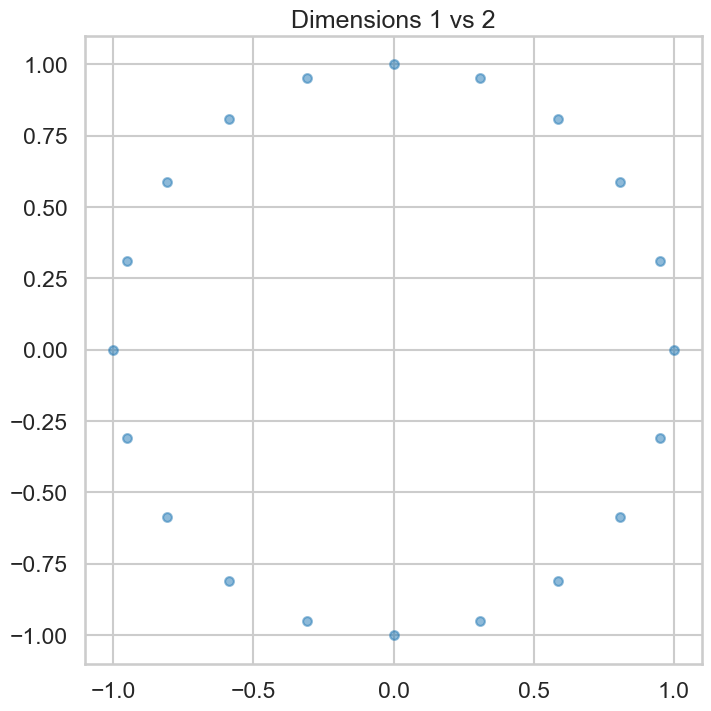

In [124]:
# prepare the figure sise and background 
# this part can be replaced by a number of subplots 
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")
# Produce a data set that represent the x and y o coordinates of a circle 
# this part can be replaced by data that you import froma file 
angle = np.linspace(0,2*np.pi,20, endpoint = False)
X1 = np.append([np.cos(angle)],[np.sin(angle)],0).transpose()
# Data is displayed 
# to display the data only it is assumed that the number of clusters is zero which is the default of the fuction 
display_cluster(X1,[],0)

> #### 2.3. Example 2 : Multi blob Data Gen and display 

C:\Users\Admin\AppData\Local\Temp\ipykernel_19984\1806768704.py:10: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(wspace=2, hspace=2)
C:\Users\Admin\AppData\Local\Temp\ipykernel_19984\1806768704.py:24: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(X[:,i], X[:,j], c=color[0], alpha=alpha, s=s)


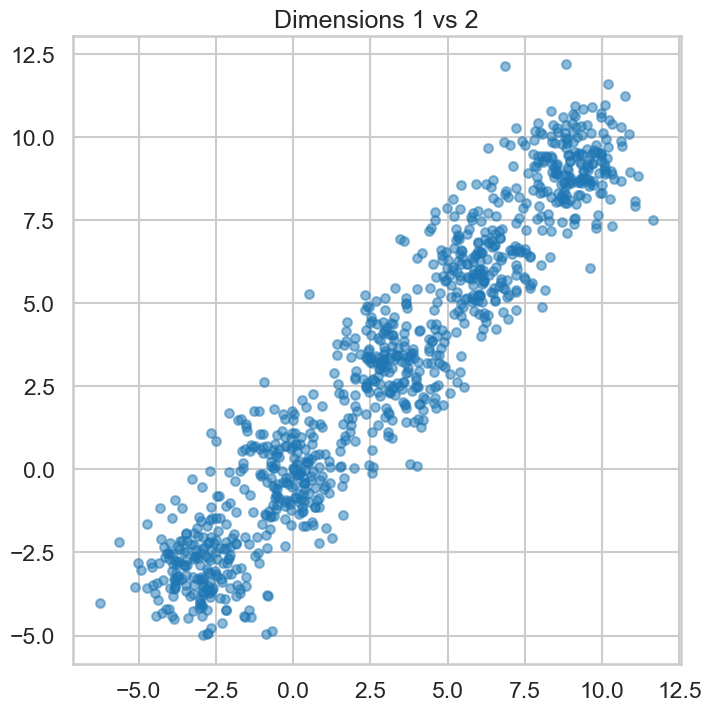

In [125]:
n_samples = 1000
n_bins = 4  
centers = [(-3, -3), (0, 0), (3, 3), (6, 6), (9,9)]
X2, y2 = make_blobs(n_samples=n_samples, n_features=2, cluster_std=1.0,
                  centers=centers, shuffle=False, random_state=42)
display_cluster(X2,[],0)

#### 2.3. Example 3 : moons Data Gen and display 

C:\Users\Admin\AppData\Local\Temp\ipykernel_19984\1806768704.py:10: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(wspace=2, hspace=2)
C:\Users\Admin\AppData\Local\Temp\ipykernel_19984\1806768704.py:24: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(X[:,i], X[:,j], c=color[0], alpha=alpha, s=s)


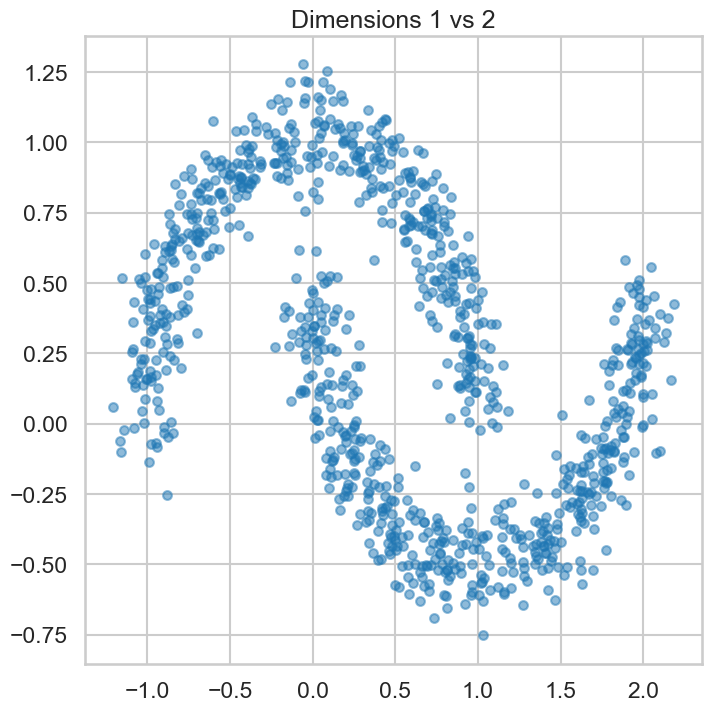

In [126]:
n_samples = 1000
X3, y3 = noisy_moons = make_moons(n_samples=n_samples, noise= .1)
display_cluster(X3,[],0)

## 3. Testing the GUC_Kmean function on Simple 2D
1. Apply the GUC_Kmean fucntion to 2D Data provided by example 1, Example 2 and Example 3
2. Try a varing number of cluster centriods that range from 2 to 10 clusters on each set 
3. Display your results.
4. plot the Cluster perfromance Metric versus the number of clusters
4. Change the distance function and repeat the above steps 

Distance Typeeeee Euclidean


C:\Users\Admin\AppData\Local\Temp\ipykernel_19984\2727089480.py:10: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(wspace=2, hspace=2)
C:\Users\Admin\AppData\Local\Temp\ipykernel_19984\2727089480.py:26: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(X[km.labels_==k].iloc[:,i], X[km.labels_==k].iloc[:,j], c=color[k], alpha=alpha, s=s)
C:\Users\Admin\AppData\Local\Temp\ipykernel_19984\2727089480.py:27: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  

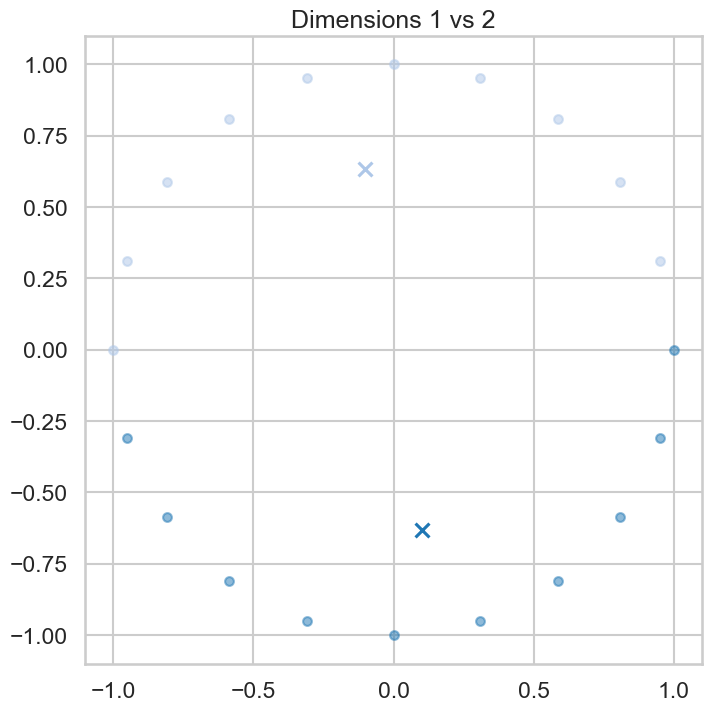

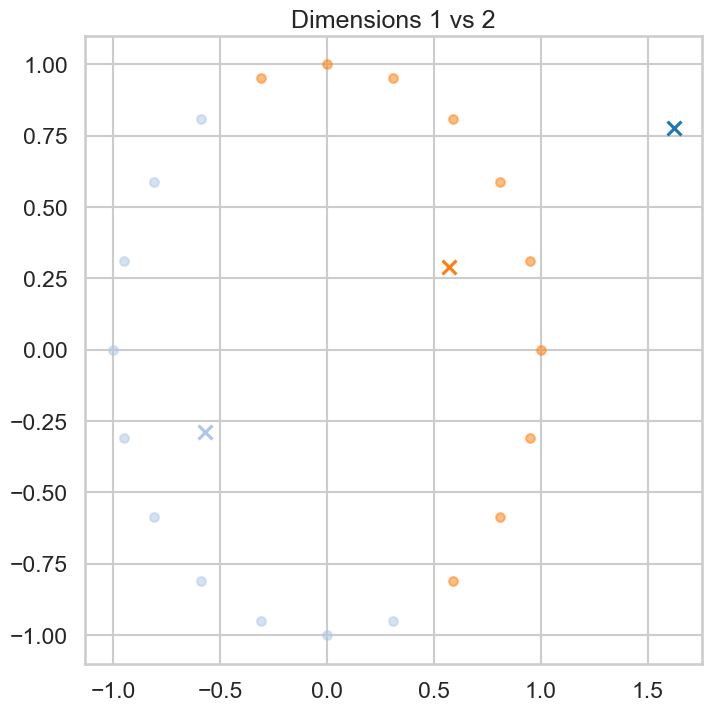

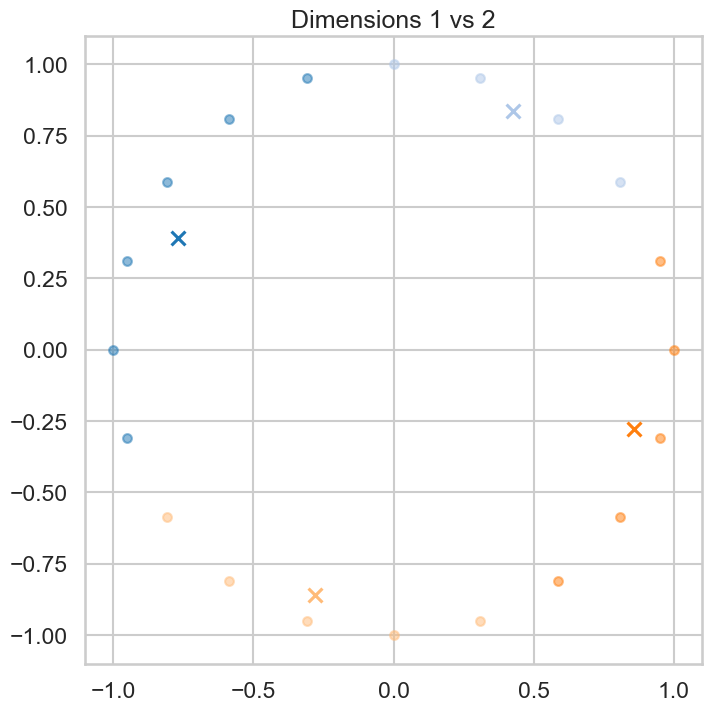

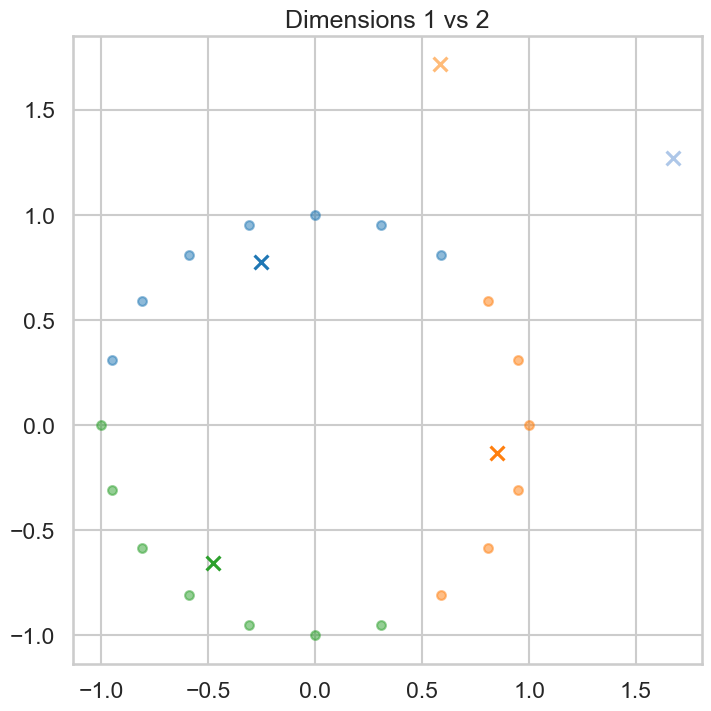

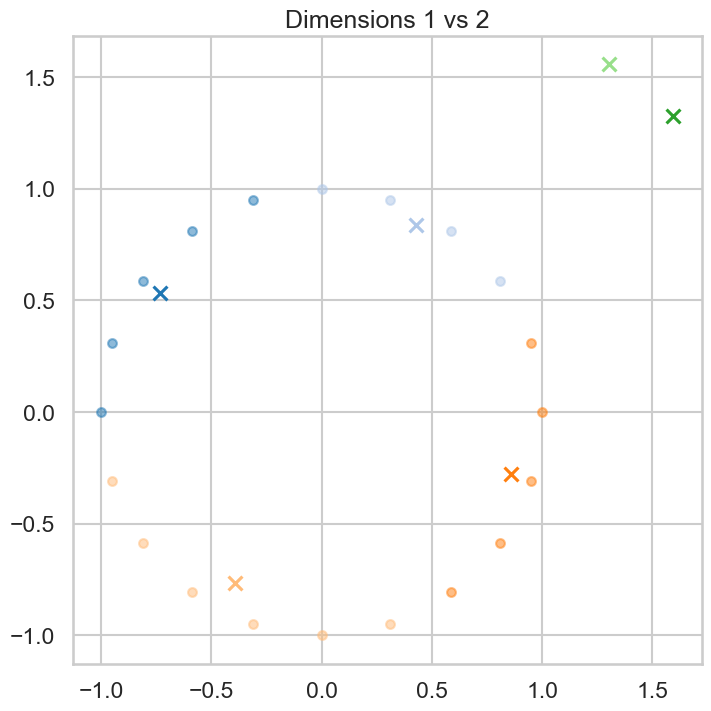

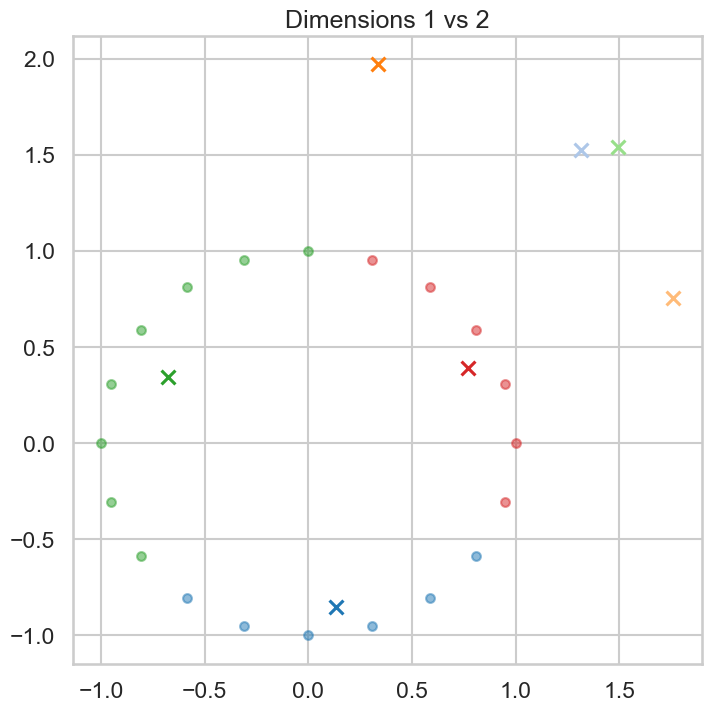

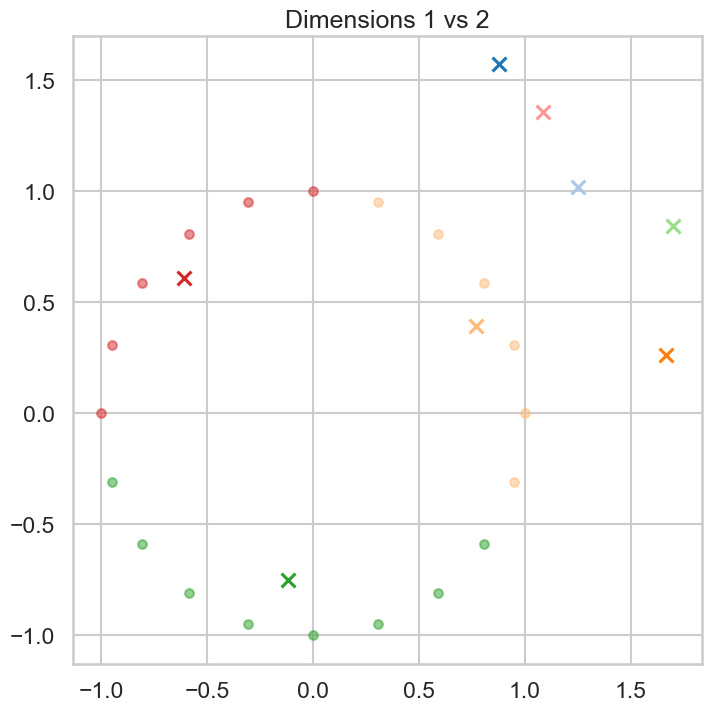

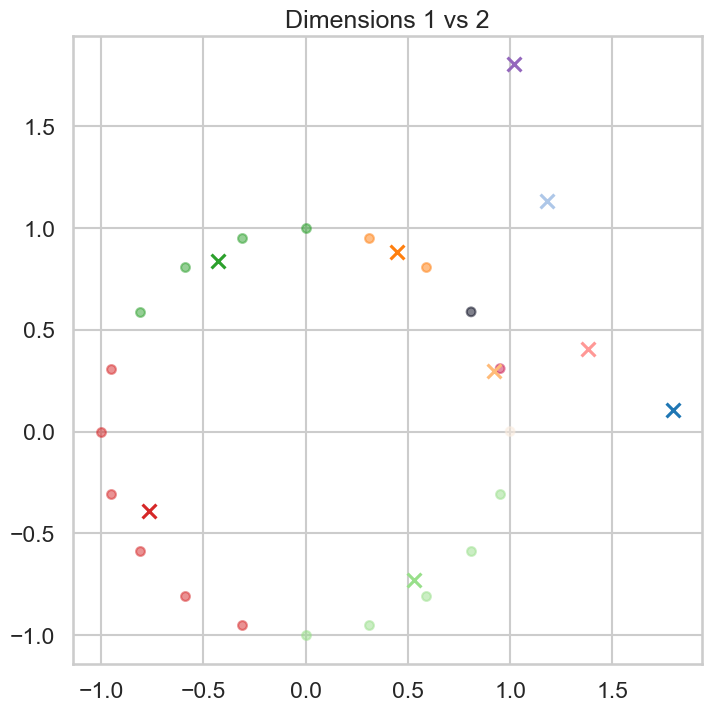

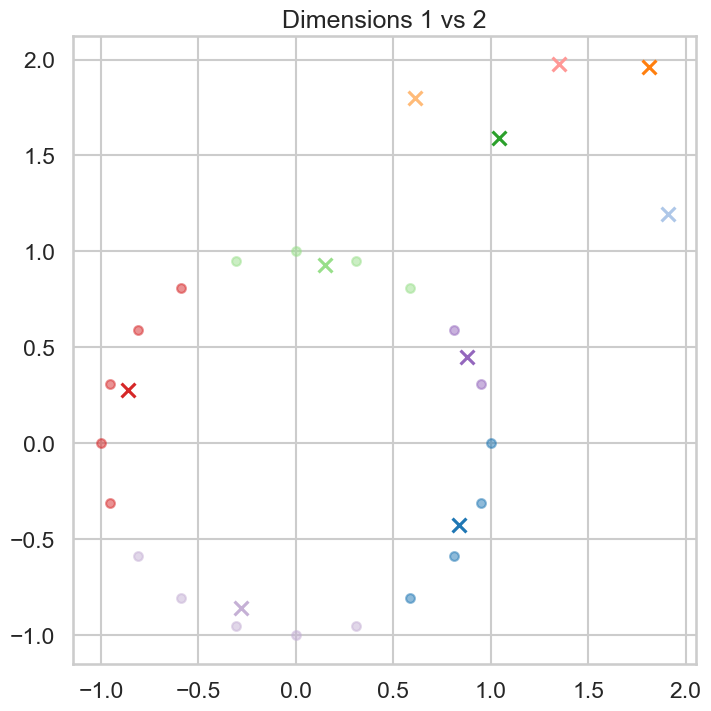

Distance Typeeeee Pearson


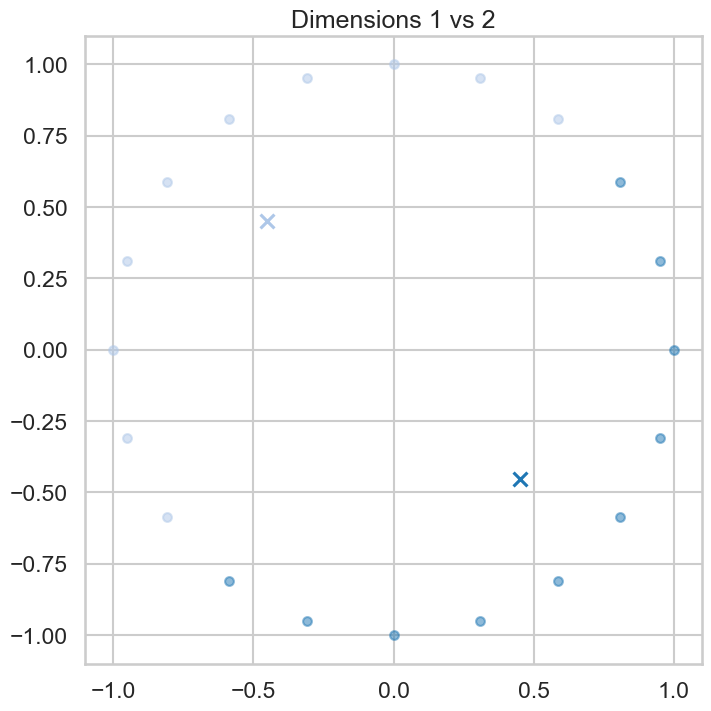

KeyboardInterrupt: 

In [128]:
# Define the range of cluster centroids
num_clusters_range = range(2, 11)

# Define the distance types
distance_types = ["Euclidean", "Pearson"]

# Iterate over each dataset and distance type
for data, example in zip([X1, X2, X3], ["Example 1", "Example 2", "Example 3"]):
    for distance_type in distance_types:
        print("Distance Typeeeee",distance_type)
        cluster_metrics = []
    
        #Apply K means for each number of clusters for each example. 
        for num_clusters in num_clusters_range:
            data_pd=pd.DataFrame(data)
            result=GUC_Kmean(data_pd,num_clusters,distance_type) 
            cluster_metrics.append(result[1])
    
    plt.plot(num_clusters_range, cluster_metrics)

    plt.xlabel('Number of Clusters')
    plt.ylabel('Cluster Performance Metric')
    plt.title('Cluster Performance Metric vs Number of Clusters')
    plt.legend()
    plt.grid(True)
    plt.show()     

## 4. Using the GUC_Kmean function to segment customers int he provided customer dataset
1. Apply the GUC_Kmean fucntion to customer data  
2. Try a varing number of cluster that range from 2 to 10 cluster on each set 
3. Display your results.
4. plot the Cluster Metric versus the number of clusters
4. Change the distance function and repeat the above steps 

Distance Typeeeee Euclidean


C:\Users\Admin\AppData\Local\Temp\ipykernel_19984\4269556079.py:10: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(wspace=2, hspace=2)
C:\Users\Admin\AppData\Local\Temp\ipykernel_19984\4269556079.py:26: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(X[km.labels_==k].iloc[:,i], X[km.labels_==k].iloc[:,j], c=color[k], alpha=alpha, s=s)
C:\Users\Admin\AppData\Local\Temp\ipykernel_19984\4269556079.py:27: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  

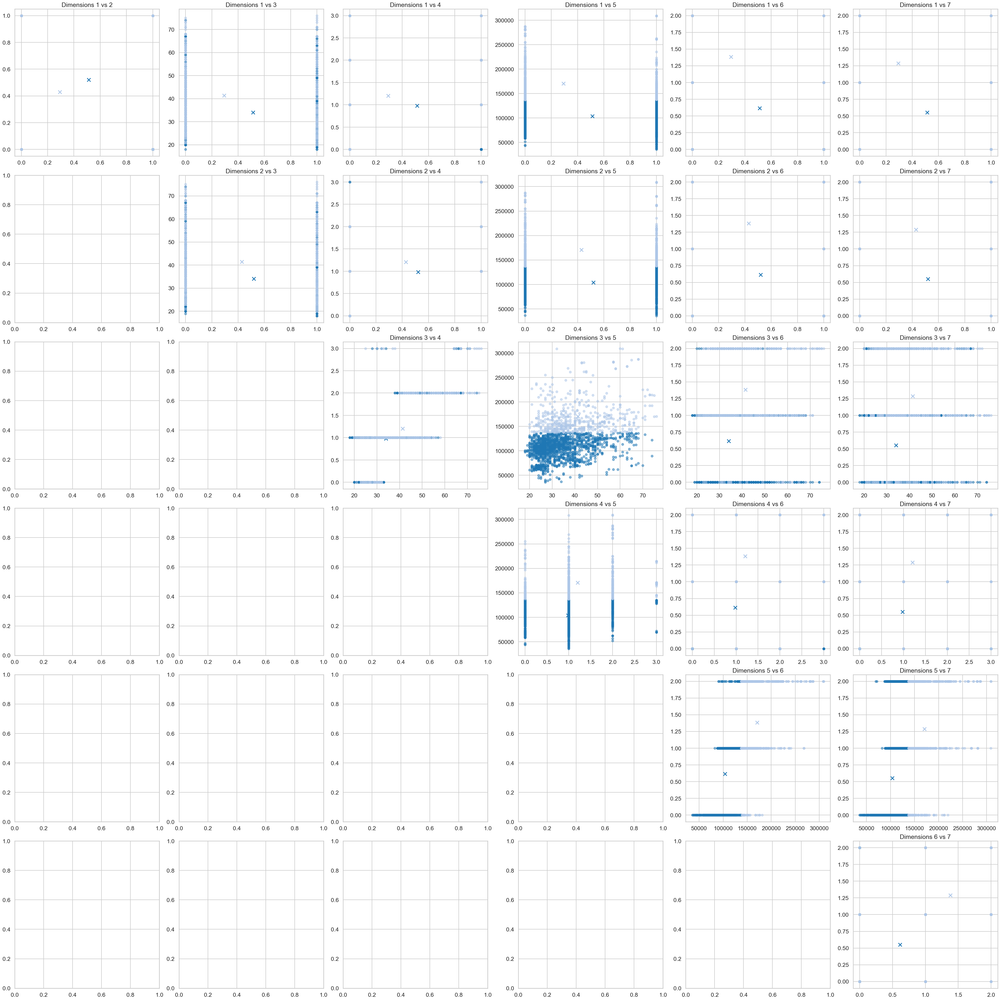

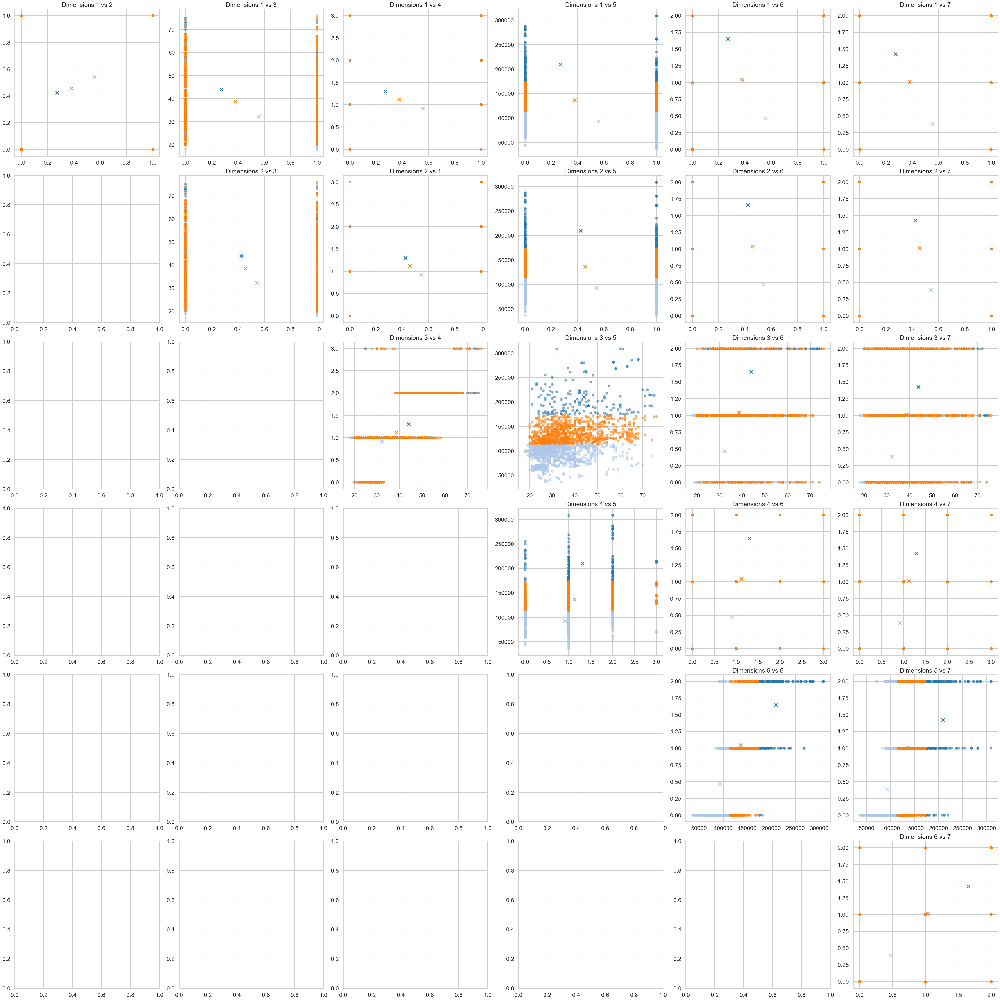

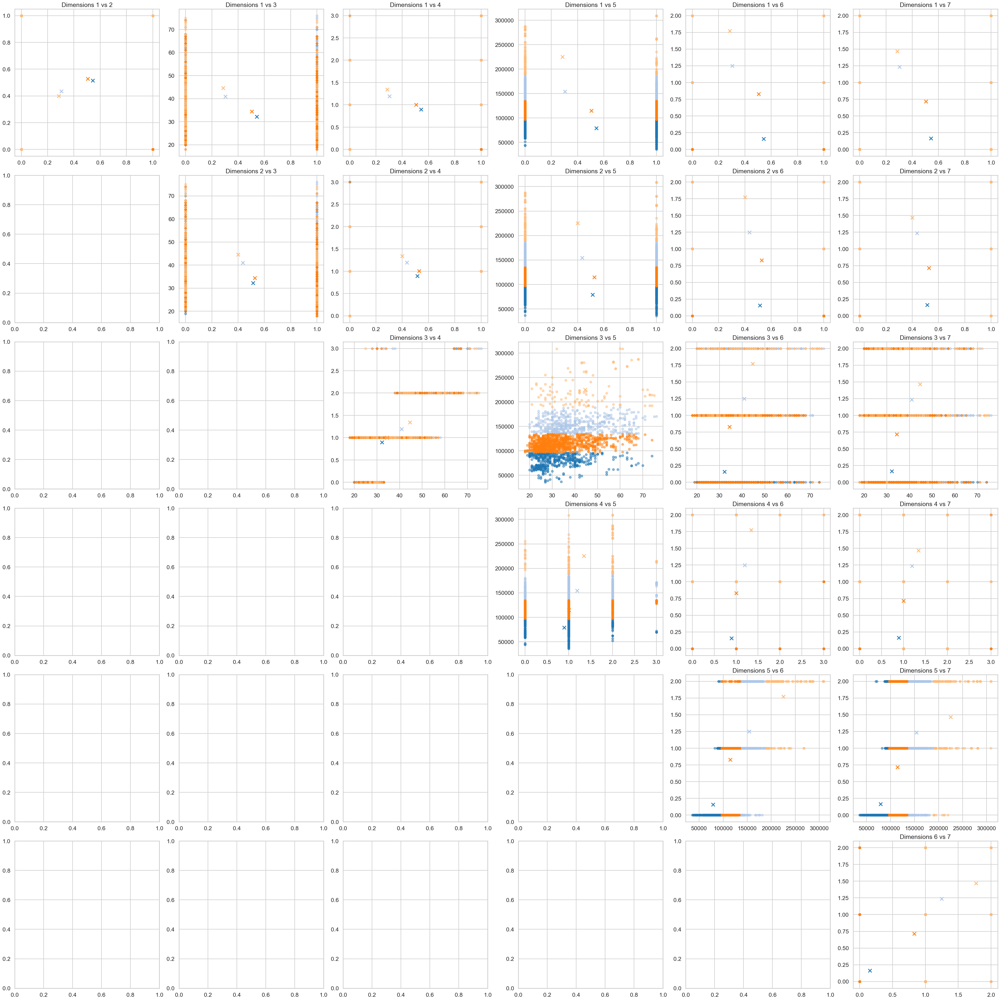

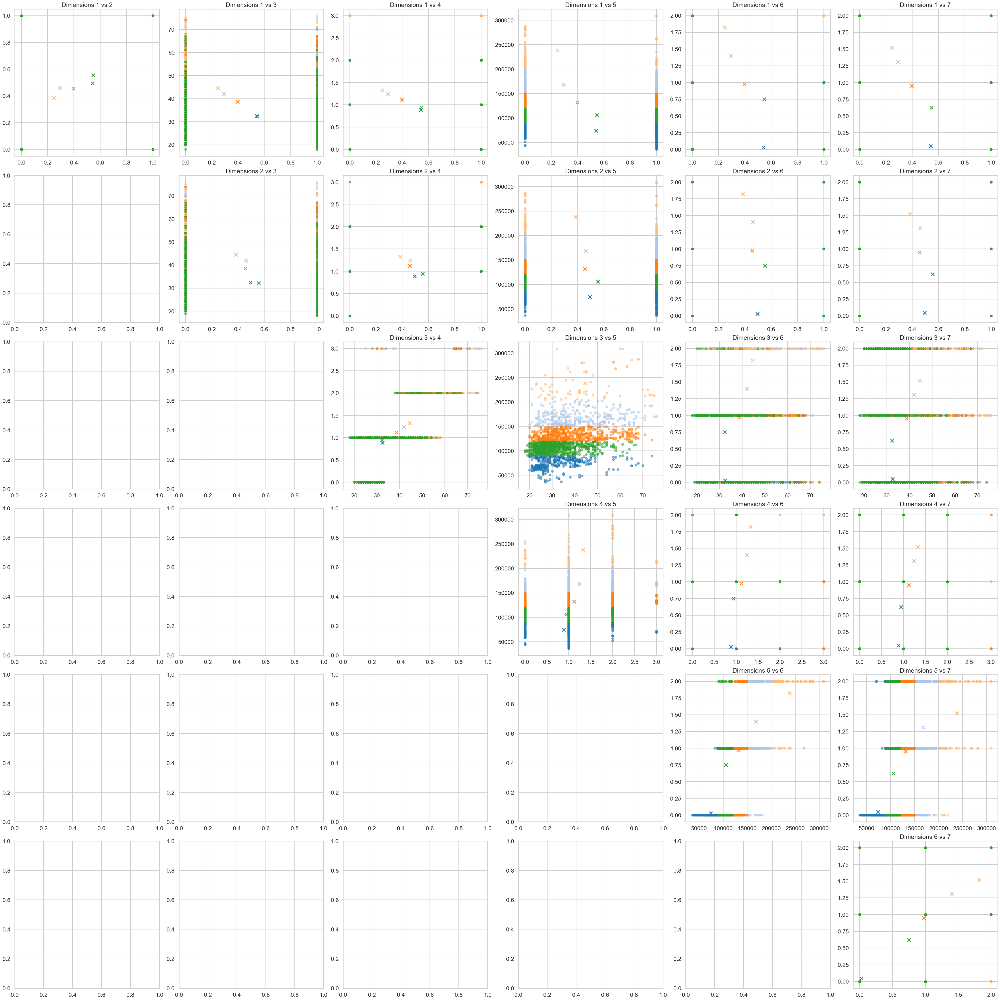

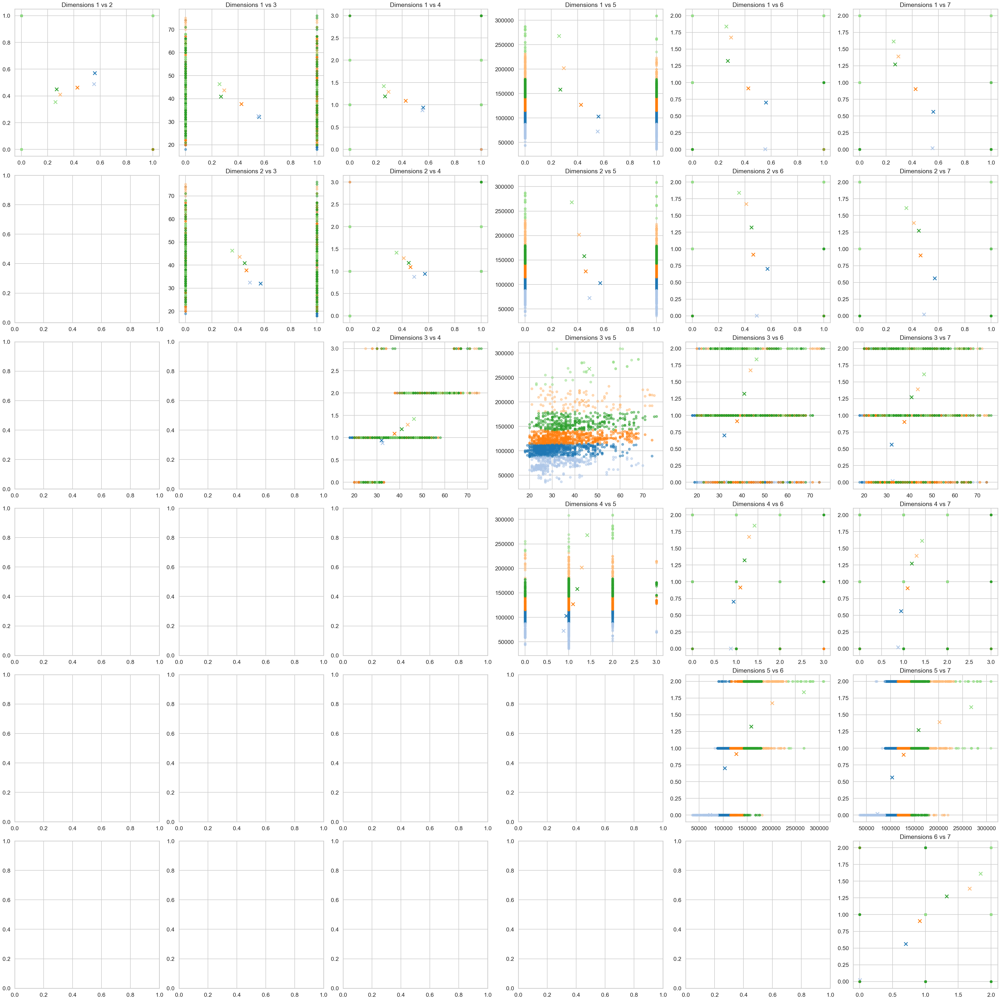

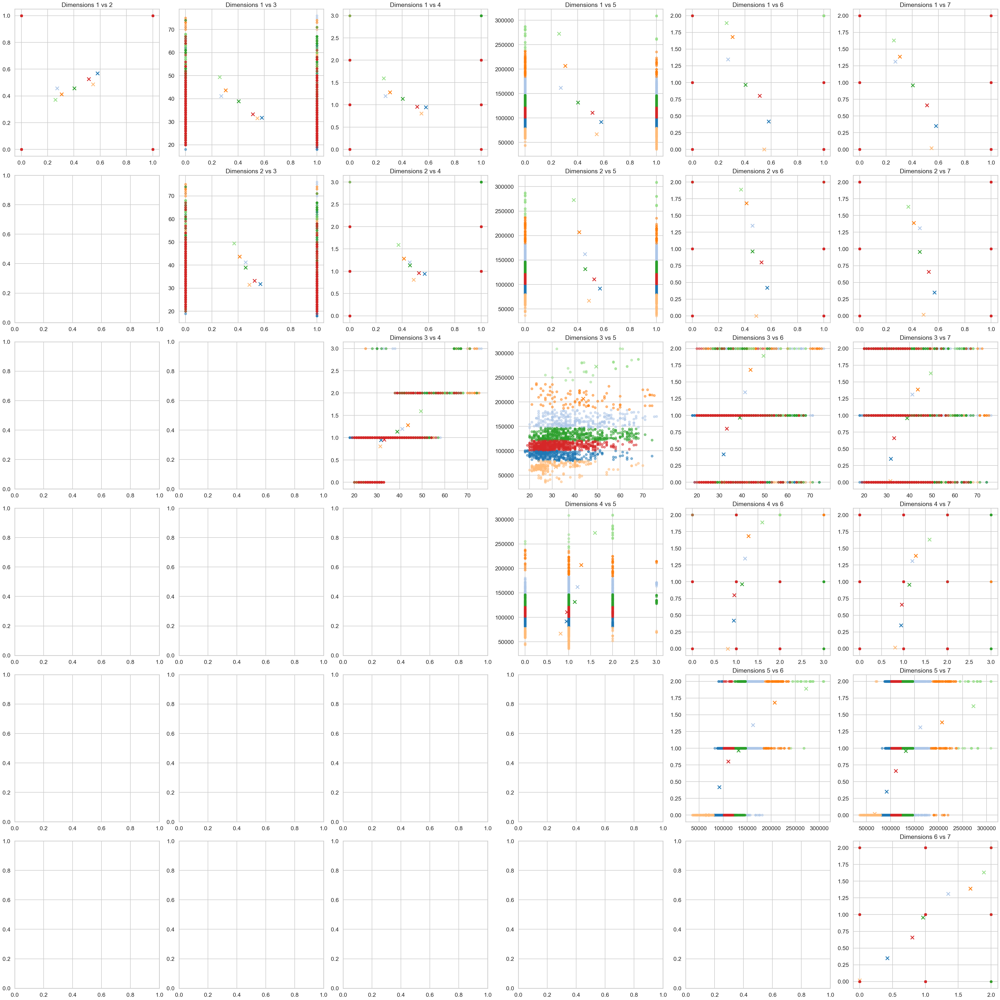

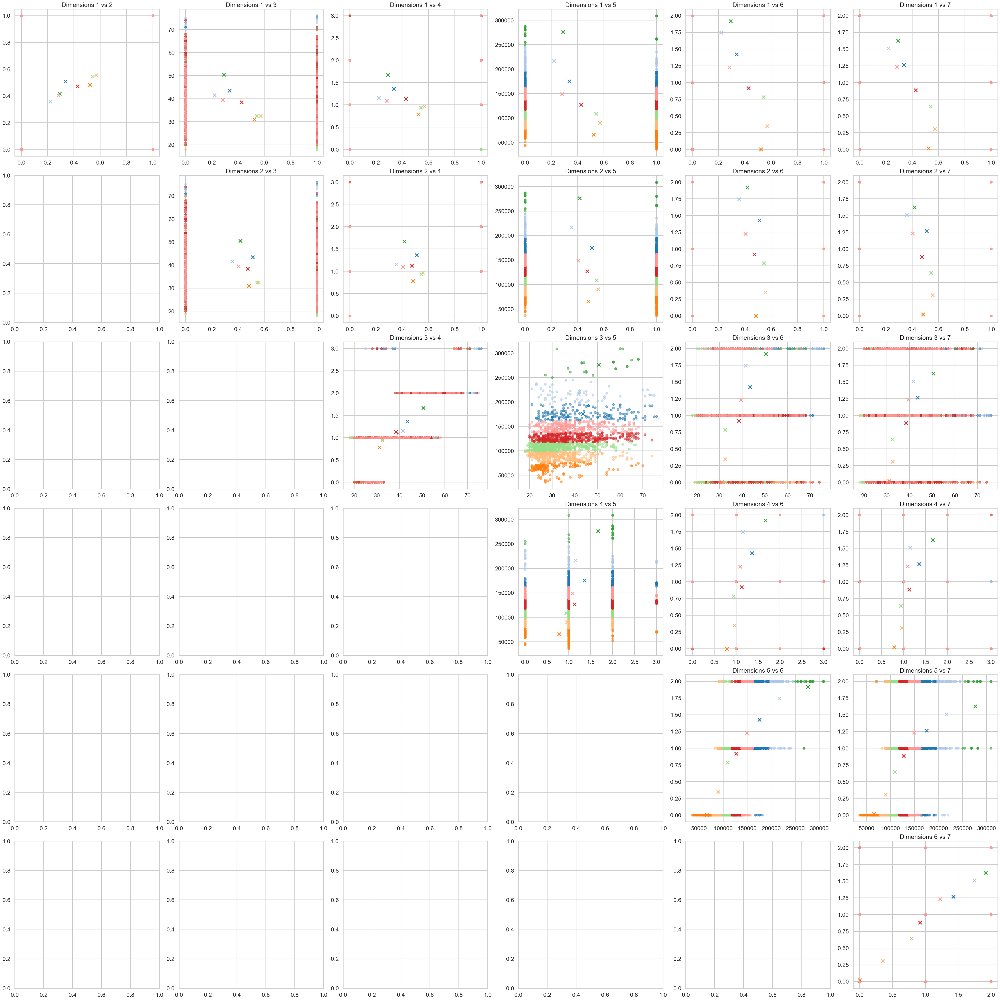

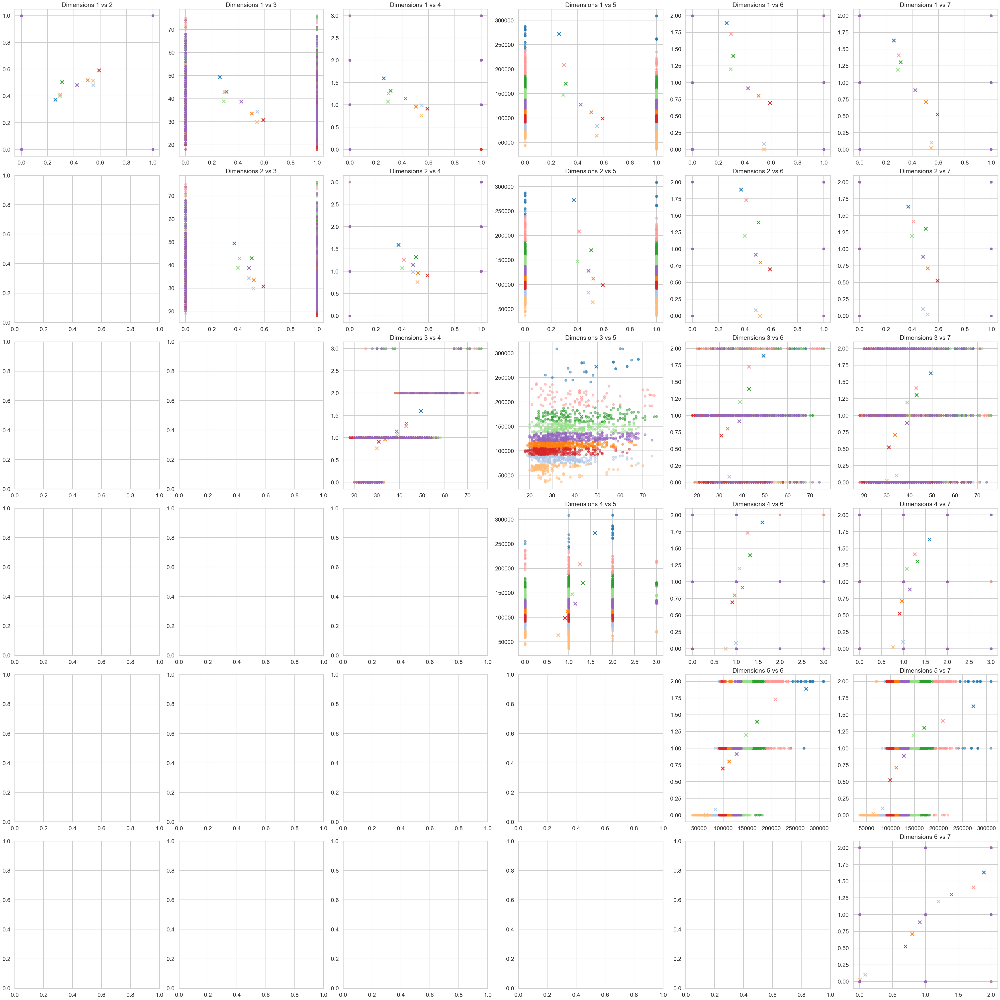

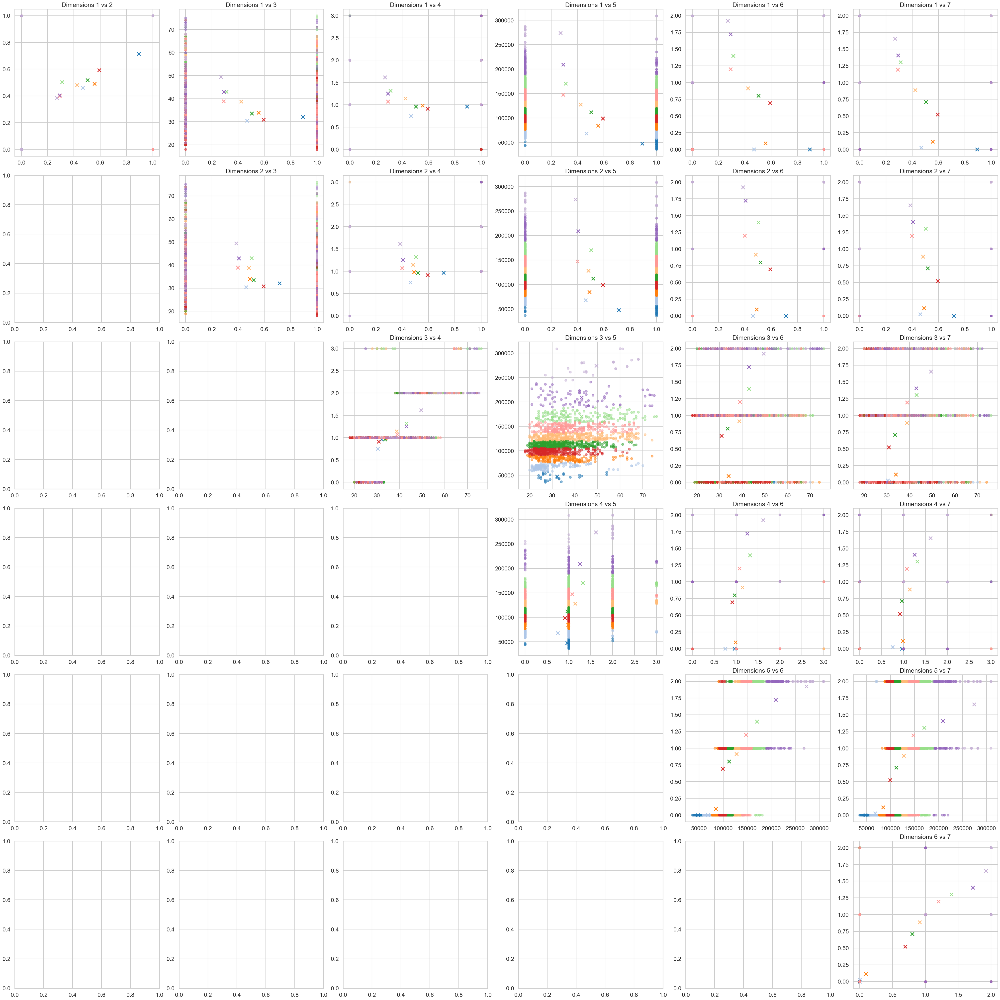

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


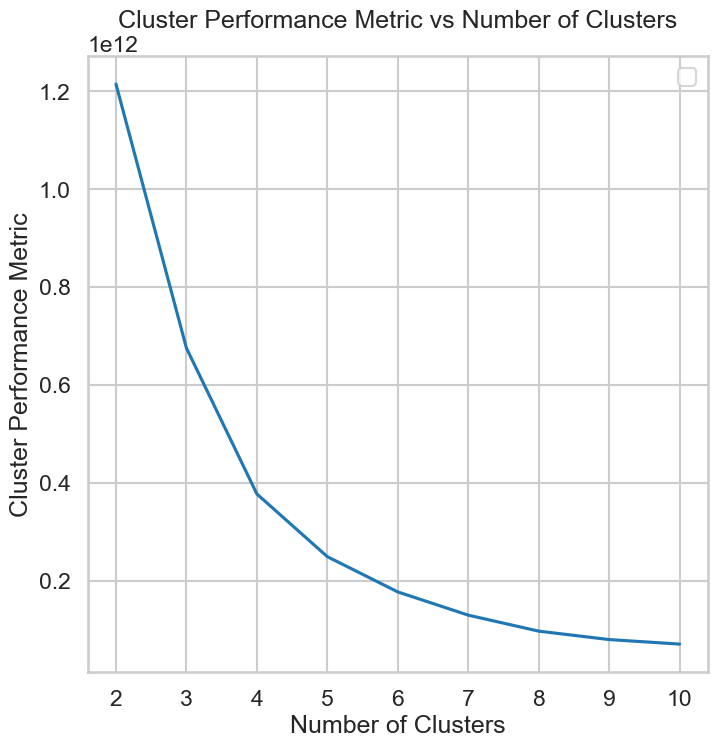

Distance Typeeeee Pearson


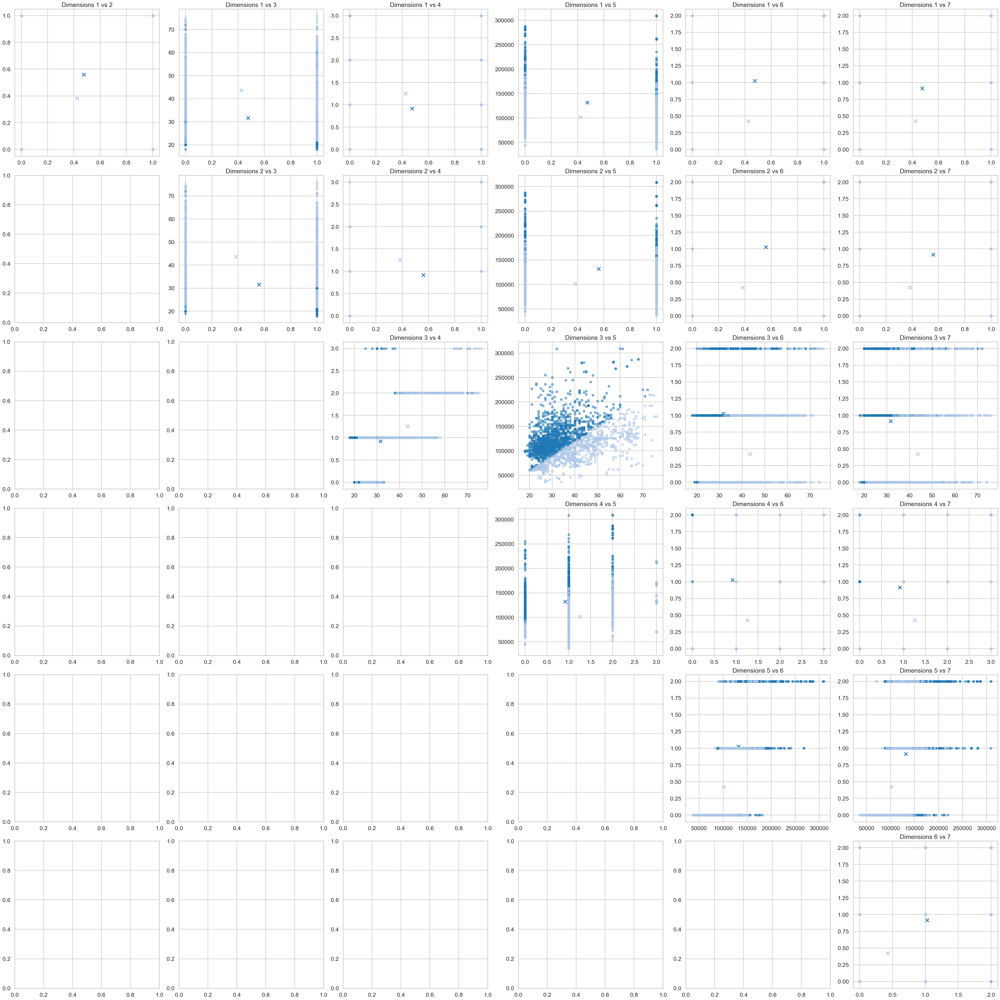

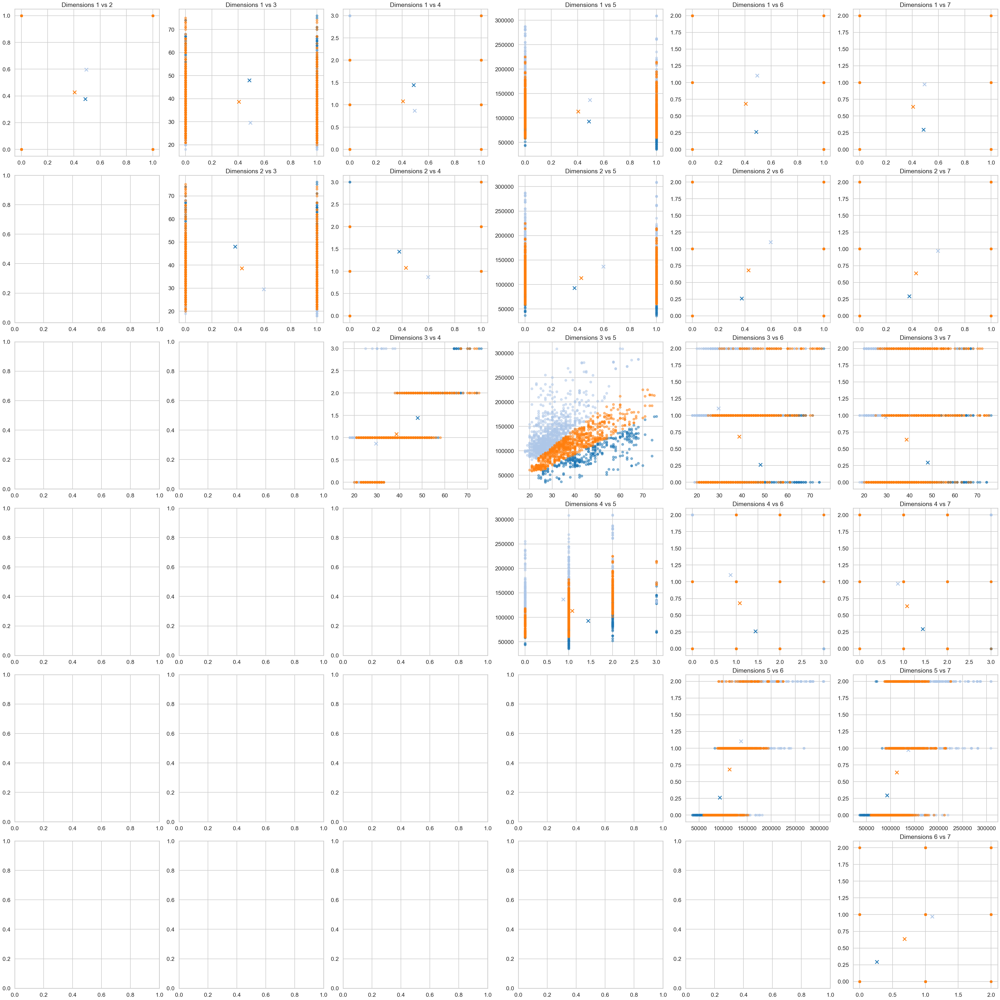

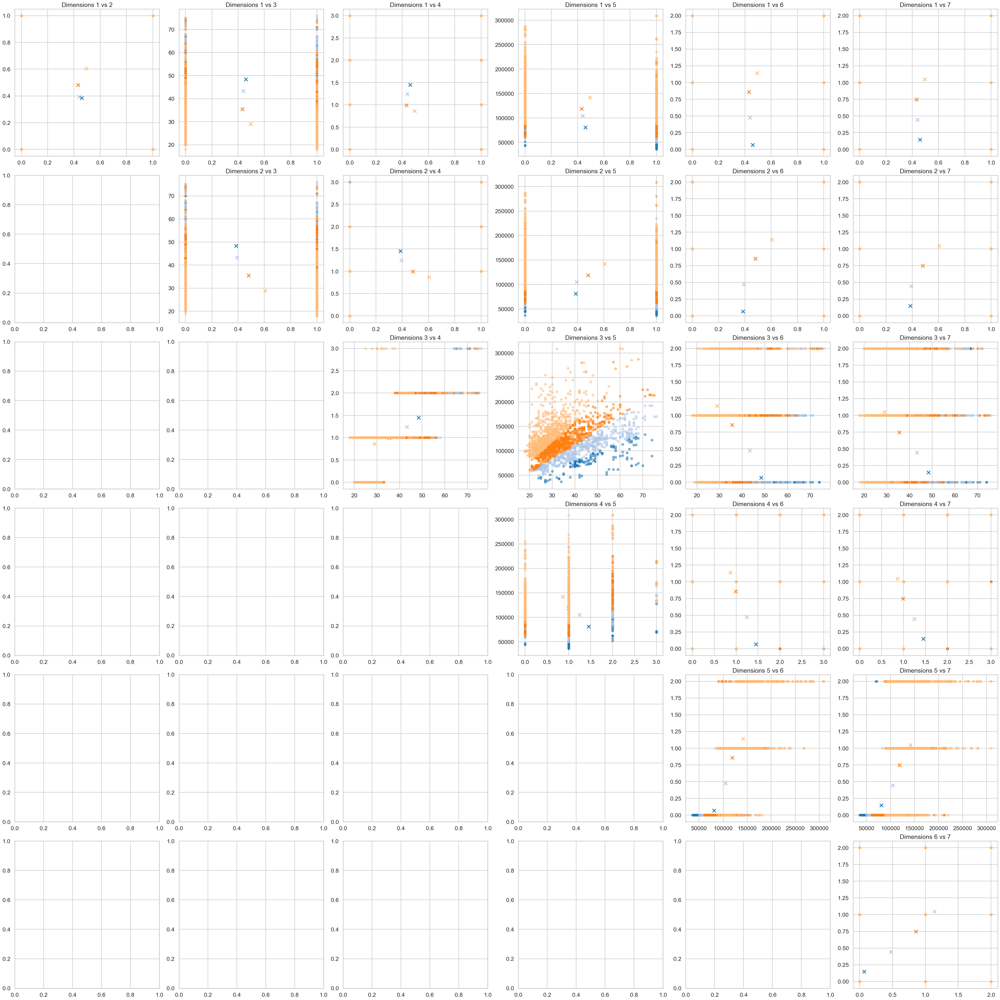

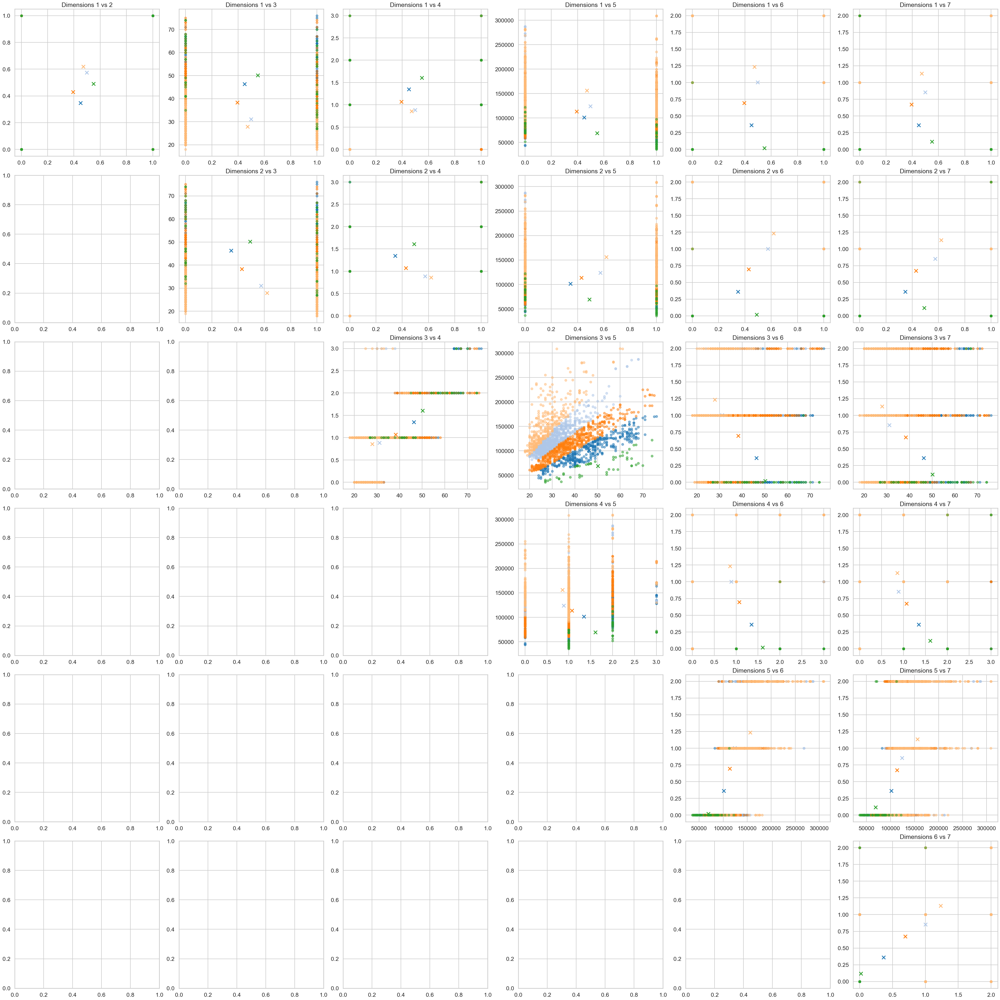

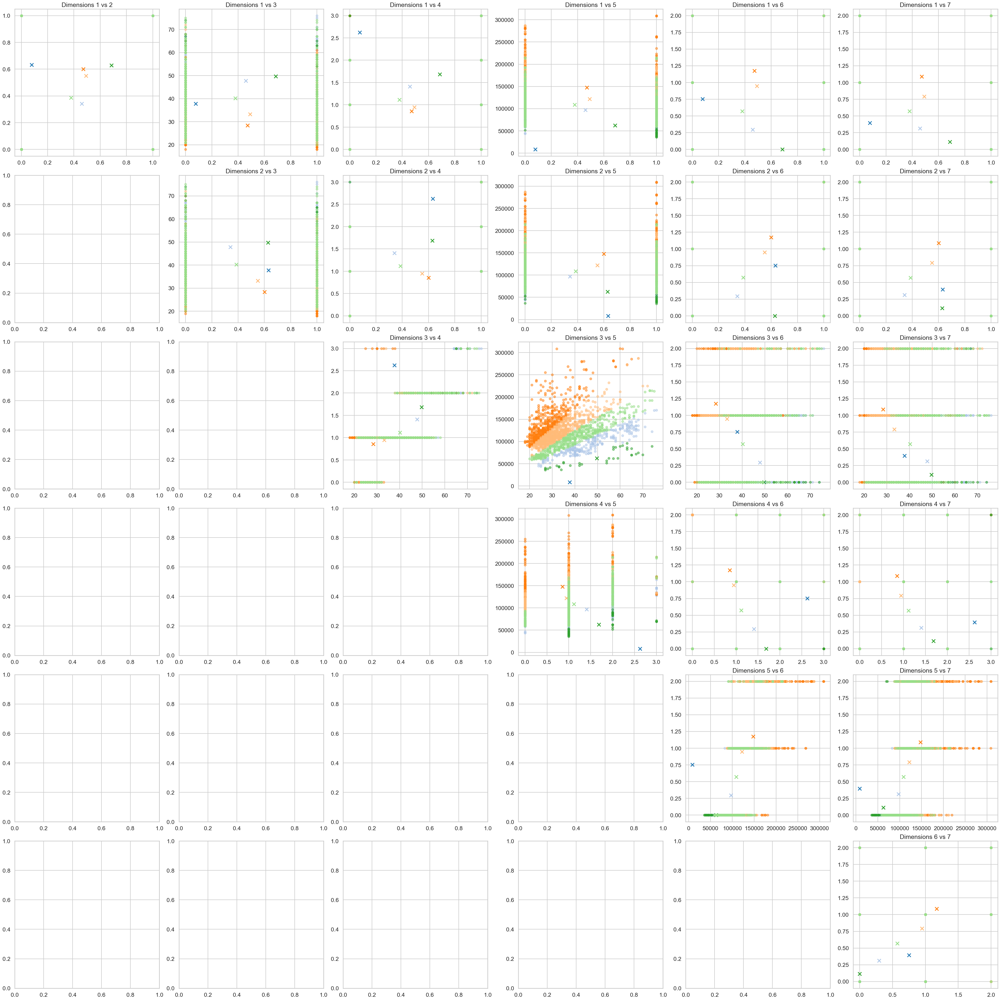

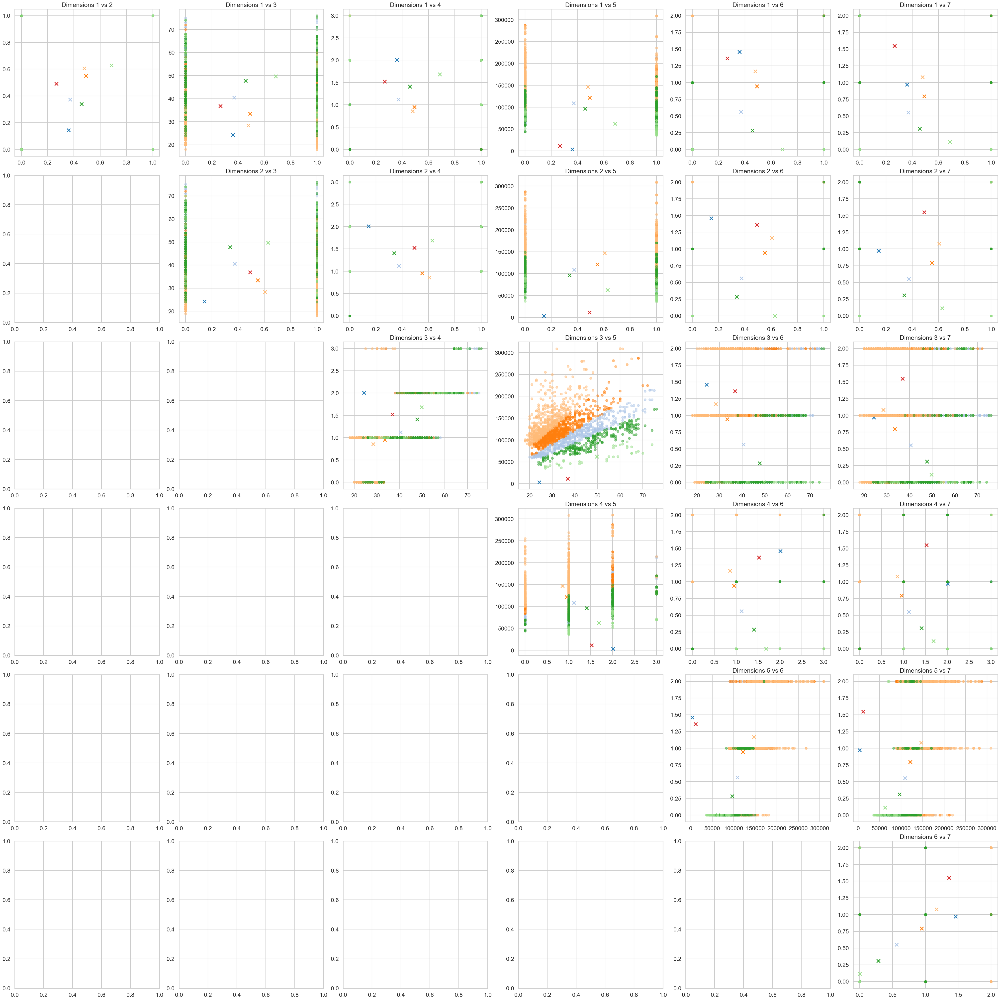

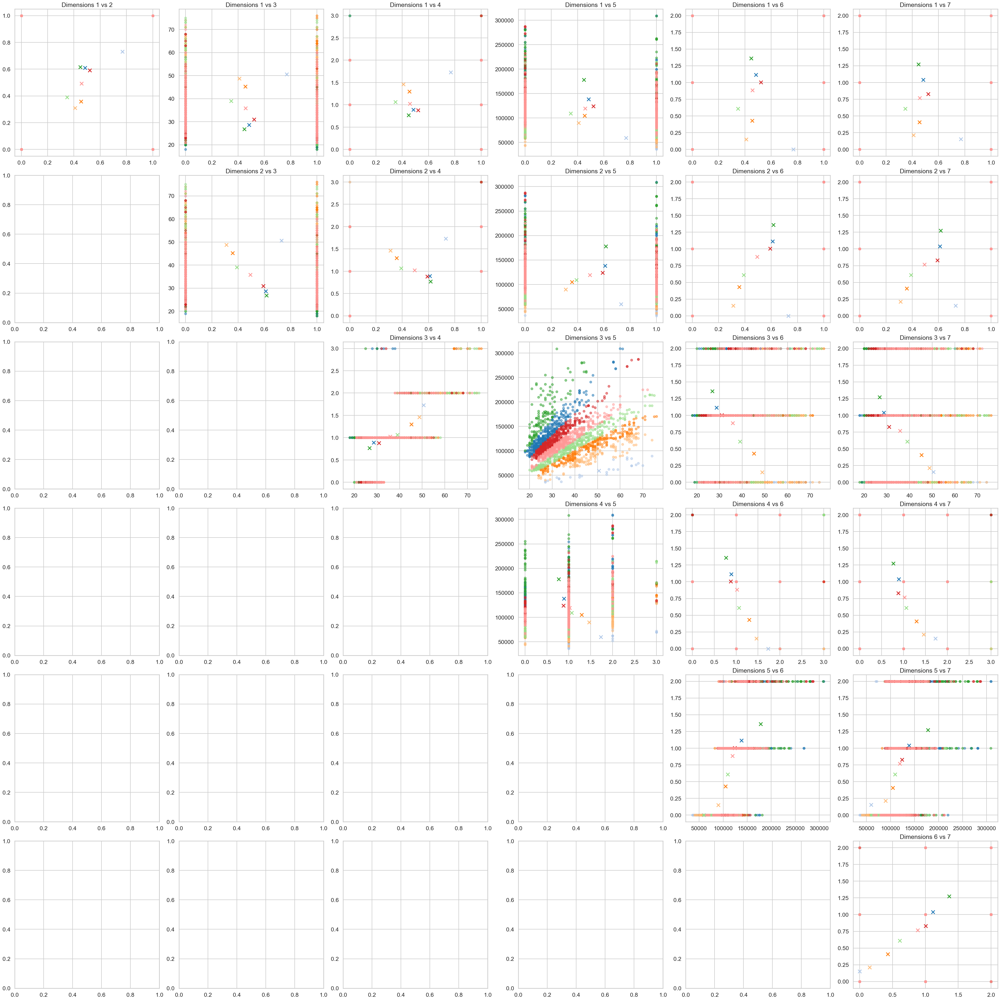

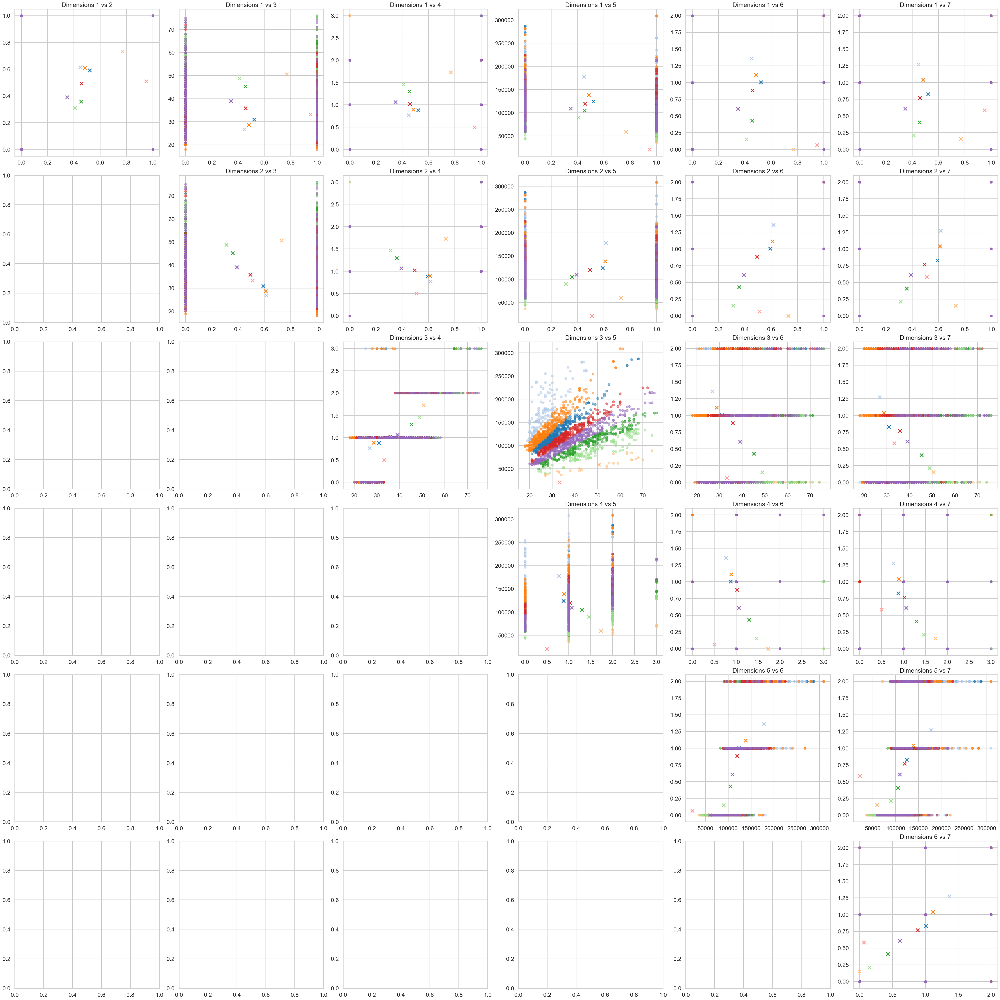

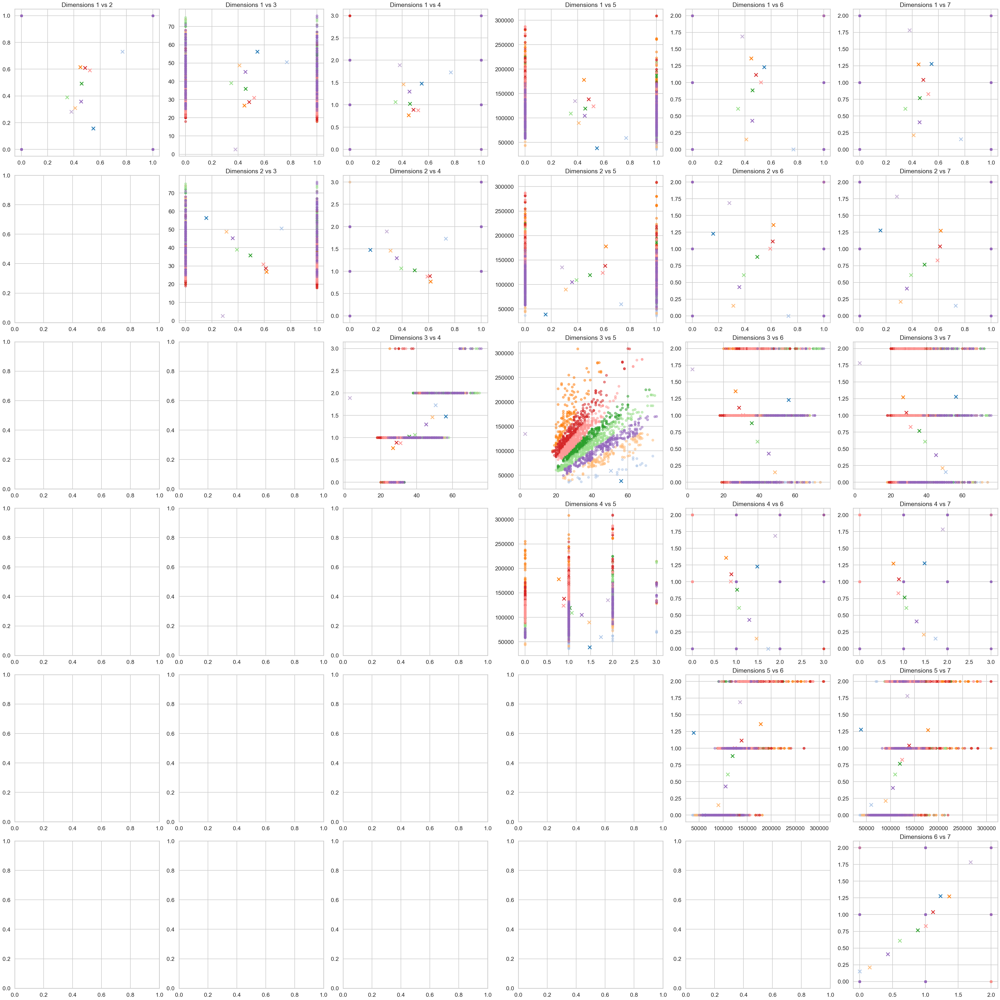

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


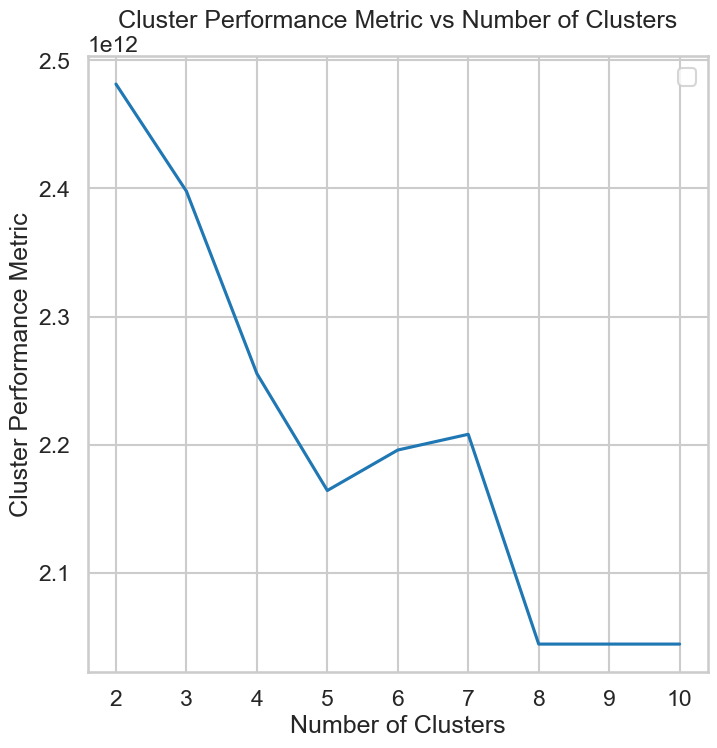

In [130]:
# Define the range of cluster centroids
num_clusters_range = range(2, 11)

# Define the distance types
distance_types = ["Euclidean", "Pearson"]

for distance_type in distance_types:
    print("Distance Typeeeee",distance_type)
    cluster_metrics = []
    
    #Apply K means for each number of clusters for each example.
    for num_clusters in num_clusters_range:
        result=GUC_Kmean(customer_data_df,num_clusters,distance_type) 
        cluster_metrics.append(result[1])
        
    plt.plot(num_clusters_range, cluster_metrics)
    plt.xlabel('Number of Clusters')
    plt.ylabel('Cluster Performance Metric')
    plt.title('Cluster Performance Metric vs Number of Clusters')
    plt.legend()
    plt.grid(True)
    plt.show()   